# Ian Mbaya - 07/02/2024
# Time Series - Sales Forecasting Python Project
### Link to Dataset - https://www.kaggle.com/competitions/store-sales-time-series-forecasting/data

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
from datetime import timedelta
from prophet import Prophet

In [3]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
stores = pd.read_csv('stores.csv')
oil = pd.read_csv('oil.csv')
transactions = pd.read_csv('transactions.csv')
holidays_events = pd.read_csv('holidays_events.csv')

## Data Preprocessing & Feature Engineering

In [4]:
## Convert date columns to datetime
train['date'] = pd.to_datetime(train['date'])
test['date'] = pd.to_datetime(test['date'])
oil['date'] = pd.to_datetime(oil['date'])
transactions['date'] = pd.to_datetime(transactions['date'])
holidays_events['date'] = pd.to_datetime(holidays_events['date'])

In [5]:
## Print the number of unique family categories

# Number of unique values in 'family' column
print(f"Number of unique values in product 'family' column: {train['family'].nunique()}")

# Unique values in 'family' column
print("Unique values in 'family' column:")
print(train['family'].unique())


Number of unique values in product 'family' column: 33
Unique values in 'family' column:
['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE SUPPLIES' 'SEAFOOD']


In [6]:
## Define Broad Categories for Visualization

### Define new mapping categories
category_mapping = {
    'BEVERAGES': 'Food and Beverages',
    'BREAD/BAKERY': 'Food and Beverages',
    'DAIRY': 'Food and Beverages',
    'DELI': 'Food and Beverages',
    'EGGS': 'Food and Beverages',
    'FROZEN FOODS': 'Food and Beverages',
    'GROCERY I': 'Food and Beverages',
    'GROCERY II': 'Food and Beverages',
    'MEATS': 'Food and Beverages',
    'POULTRY': 'Food and Beverages',
    'PREPARED FOODS': 'Food and Beverages',
    'PRODUCE': 'Food and Beverages',
    'SEAFOOD': 'Food and Beverages',
    
    'BABY CARE': 'Personal Care and Household',
    'BEAUTY': 'Personal Care and Household',
    'CLEANING': 'Personal Care and Household',
    'HOME CARE': 'Personal Care and Household',
    'PERSONAL CARE': 'Personal Care and Household',
    
    'HOME AND KITCHEN I': 'Home and Kitchen',
    'HOME AND KITCHEN II': 'Home and Kitchen',
    'HOME APPLIANCES': 'Home and Kitchen',
    'LAWN AND GARDEN': 'Home and Kitchen',
    
    'LADIESWEAR': 'Clothing and Accessories',
    'LINGERIE': 'Clothing and Accessories',
    
    'BOOKS': 'Specialty',
    'MAGAZINES': 'Specialty',
    'SCHOOL AND OFFICE SUPPLIES': 'Specialty',
    'HARDWARE': 'Specialty',
    'CELEBRATION': 'Specialty',
    'LIQUOR,WINE,BEER': 'Specialty',
    'PET SUPPLIES': 'Specialty',
    
    'PLAYERS AND ELECTRONICS': 'Entertainment and Electronics',
    
    'AUTOMOTIVE': 'AUTOMOTIVE'
}

# Create DataFrame from the train data
train_df = pd.DataFrame({'family': train['family'].unique()})

# Apply the category mapping
train_df['broad_category'] = train_df['family'].map(category_mapping)


# Print the DataFrame with the new broad categories
print("\nDataFrame with broad categories:")
print(train_df)



DataFrame with broad categories:
                        family                 broad_category
0                   AUTOMOTIVE                     AUTOMOTIVE
1                    BABY CARE    Personal Care and Household
2                       BEAUTY    Personal Care and Household
3                    BEVERAGES             Food and Beverages
4                        BOOKS                      Specialty
5                 BREAD/BAKERY             Food and Beverages
6                  CELEBRATION                      Specialty
7                     CLEANING    Personal Care and Household
8                        DAIRY             Food and Beverages
9                         DELI             Food and Beverages
10                        EGGS             Food and Beverages
11                FROZEN FOODS             Food and Beverages
12                   GROCERY I             Food and Beverages
13                  GROCERY II             Food and Beverages
14                    HARDWARE      

## Exploratory Analysis

### Sales Distribution by Store

In [7]:
# Group by store and calculate total sales
store_sales = train.groupby('store_nbr')['sales'].sum().reset_index()

# Print summary statistics
min_sales_store = store_sales.loc[store_sales['sales'].idxmin()]
max_sales_store = store_sales.loc[store_sales['sales'].idxmax()]
mean_sales = store_sales['sales'].mean()
median_sales = store_sales['sales'].median()

print(f"Store with minimum sales: Store {min_sales_store['store_nbr']} with {min_sales_store['sales'] / 1e6:.2f} million sales")
print(f"Mean total sales of stores: {mean_sales / 1e6:.2f} million")
print(f"Median total sales of stores: {median_sales / 1e6:.2f} million")
print(f"Store with maximum sales: Store {max_sales_store['store_nbr']} with {max_sales_store['sales'] / 1e6:.2f} million sales")



Store with minimum sales: Store 52.0 with 2.70 million sales
Mean total sales of stores: 19.88 million
Median total sales of stores: 15.99 million
Store with maximum sales: Store 44.0 with 62.09 million sales


### VIsulaize high, medium, and low store sales

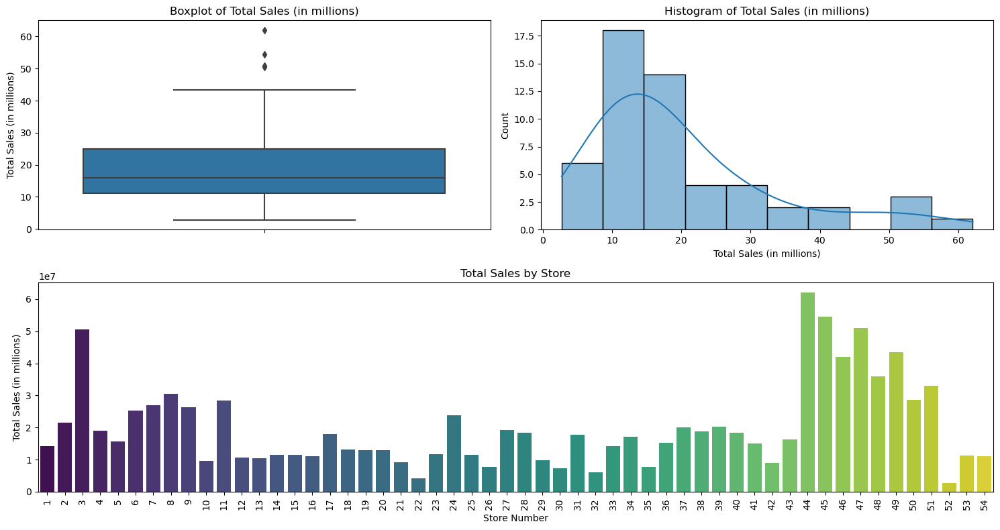

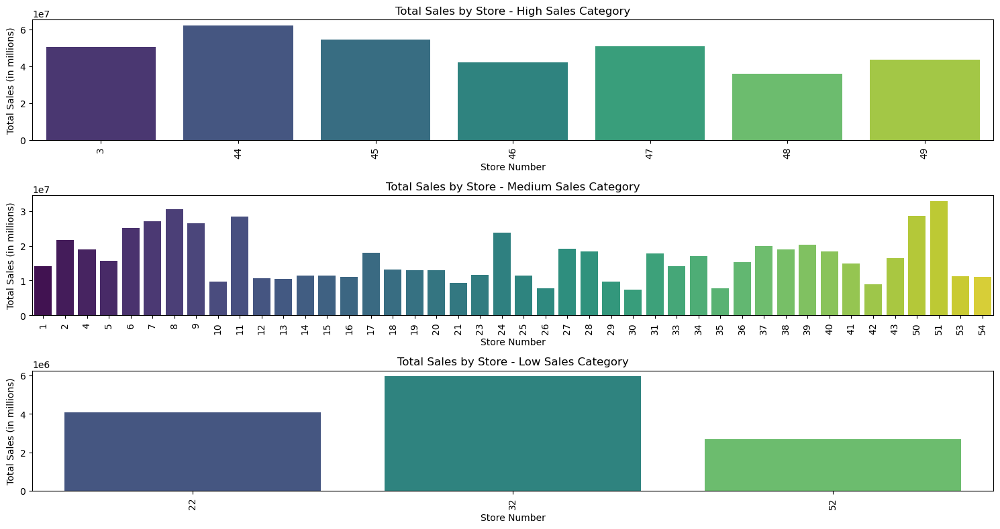

In [8]:
# Categorize stores into high, medium, or low sales
def categorize_sales(sales, mean_sales, std_sales):
    if sales > mean_sales + std_sales:
        return 'High'
    elif sales < mean_sales - std_sales:
        return 'Low'
    else:
        return 'Medium'

std_sales = store_sales['sales'].std()
store_sales['category'] = store_sales['sales'].apply(categorize_sales, args=(mean_sales, std_sales))

# Create visualizations
plt.figure(figsize=(15, 8))

# Boxplot
plt.subplot(2, 2, 1)
sns.boxplot(y=store_sales['sales'] / 1e6)
plt.title('Boxplot of Total Sales (in millions)')
plt.ylabel('Total Sales (in millions)')

# Histogram
plt.subplot(2, 2, 2)
sns.histplot(store_sales['sales'] / 1e6, bins=10, kde=True)
plt.title('Histogram of Total Sales (in millions)')
plt.xlabel('Total Sales (in millions)')

# Bar graph of total sales by store
plt.subplot(2, 1, 2)
sns.barplot(x='store_nbr', y='sales', data=store_sales, ci=None, palette='viridis')
plt.title('Total Sales by Store')
plt.xlabel('Store Number')
plt.ylabel('Total Sales (in millions)')
plt.xticks(rotation=90)
plt.tight_layout()

plt.show()

# Bar graphs by sales category
plt.figure(figsize=(15, 8))

for category in ['High', 'Medium', 'Low']:
    plt.subplot(3, 1, ['High', 'Medium', 'Low'].index(category) + 1)
    sns.barplot(x='store_nbr', y='sales', data=store_sales[store_sales['category'] == category], ci=None, palette='viridis')
    plt.title(f'Total Sales by Store - {category} Sales Category')
    plt.xlabel('Store Number')
    plt.ylabel('Total Sales (in millions)')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


### Sankey Diagram - Mapping Store Clsuters to Product Families

In [9]:
# Map the 'family' column to broad categories in train data
train['broad_category'] = train['family'].map(category_mapping)

# Merge train_df data (created earlier) with stores data on 'store_nbr'
merged_data = pd.merge(train, stores, on='store_nbr')

# Aggregate sales by 'cluster' and 'broad_category'
cluster_sales = merged_data.groupby(['cluster', 'broad_category'])['sales'].sum().reset_index()

# Create a list of unique clusters and broad categories for Sankey diagram labels
clusters = cluster_sales['cluster'].unique()
broad_categories = cluster_sales['broad_category'].unique()

# Create label mapping for Sankey diagram
all_labels = list(clusters) + list(broad_categories)
cluster_labels = {cluster: idx for idx, cluster in enumerate(clusters)}
category_labels = {category: idx + len(clusters) for idx, category in enumerate(broad_categories)}

# Create sources and targets for the Sankey diagram
sources = []
targets = []
values = []

for _, row in cluster_sales.iterrows():
    source = cluster_labels[row['cluster']]
    target = category_labels[row['broad_category']]
    sources.append(source)
    targets.append(target)
    values.append(row['sales'])

# Create the Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=all_labels
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values
    )
)])

fig.update_layout(title_text="Sankey Diagram of Sales by Cluster and Broad Category", font_size=10)
fig.show()


### Treemap - Total Sales by State and Store Type

In [10]:
# Group by state and type to calculate total sales
grouped_sales = merged_data.groupby(['state', 'type'])['sales'].sum().reset_index()

# Create a treemap using Plotly
fig = px.treemap(
    grouped_sales,
    path=['state', 'type'],  # Define the hierarchy: State -> Type
    values='sales',  # Define the size of each section
    color='sales',  # Color based on sales
    color_continuous_scale='Viridis',  # Color scale
    title='Total Sales Treemap: State (Primary Branch) and Store Type (Sub-Branch)'
)

# Show the figure
fig.show()


### Grid Line Chart - Correlation beteen Promotions and Sales Volumes

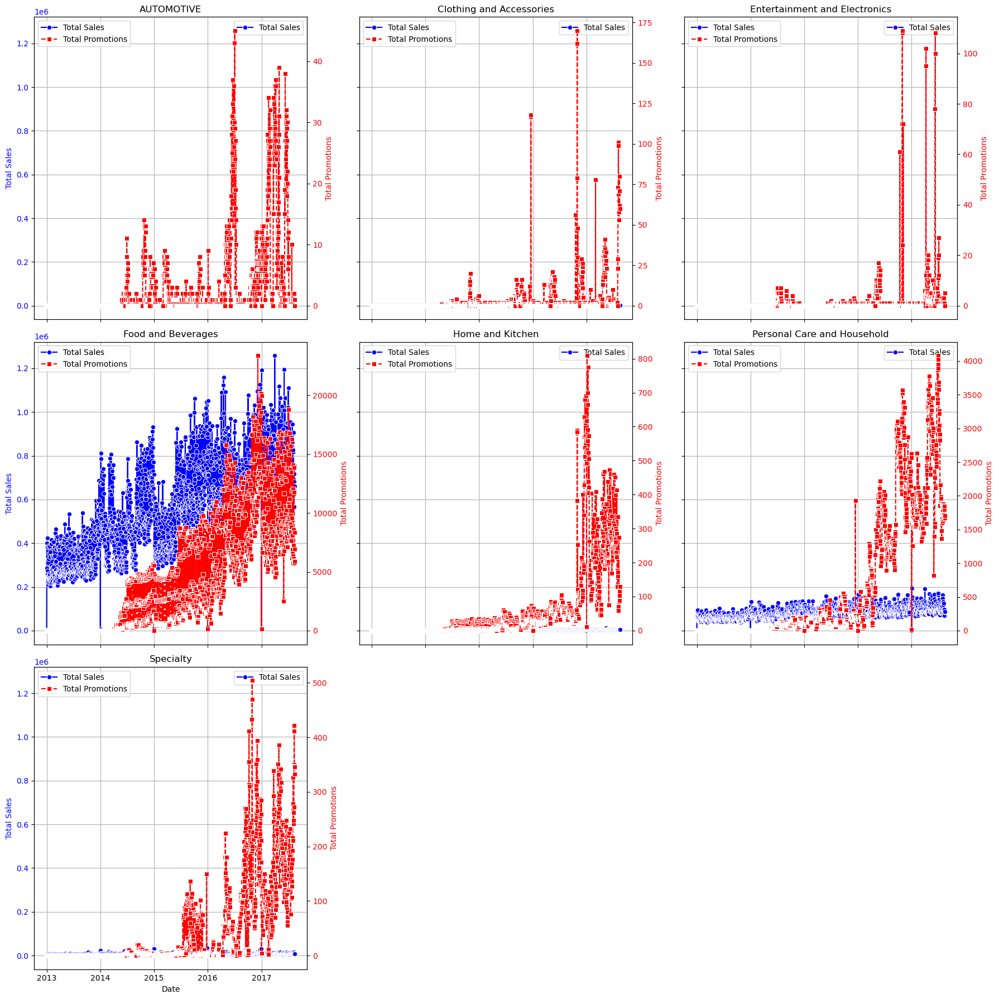

In [11]:
# Aggregate total sales and total promotions by broad category and date
aggregated_data = train.groupby(['date', 'broad_category']).agg(
    total_sales=pd.NamedAgg(column='sales', aggfunc='sum'),
    total_promotions=pd.NamedAgg(column='onpromotion', aggfunc='sum')
).reset_index()

# List of unique broad categories
categories = aggregated_data['broad_category'].unique()

# Determine grid size
grid_size = (3, 3)
fig, axes = plt.subplots(nrows=grid_size[0], ncols=grid_size[1], figsize=(18, 18), sharex=True, sharey=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot data for each category
for idx, category in enumerate(categories):
    ax = axes[idx]
    
    # Filter data for the current category
    category_data = aggregated_data[aggregated_data['broad_category'] == category]
    
    # Create twin axes for dual-axis plotting
    ax2 = ax.twinx()
    
    # Plot total sales on the primary y-axis
    sns.lineplot(data=category_data, x='date', y='total_sales', ax=ax, color='blue', marker='o', label='Total Sales')
    ax.set_ylabel('Total Sales', color='blue')
    ax.tick_params(axis='y', labelcolor='blue')
    
    # Plot total promotions on the secondary y-axis
    sns.lineplot(data=category_data, x='date', y='total_promotions', ax=ax2, color='red', marker='s', linestyle='--', label='Total Promotions')
    ax2.set_ylabel('Total Promotions', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    
    # Set title and labels
    ax.set_title(f'{category}')
    ax.set_xlabel('Date')
    ax.grid(True)
    
    # Add legend
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='upper left')

# Handle remaining empty subplots
for idx in range(len(categories), len(axes)):
    fig.delaxes(axes[idx])

# Adjust layout
plt.tight_layout()
plt.show()


## Time Series Decomposition - Historical, Trend, Seasonal, and Residual

In [12]:
train = train.sort_values(by=['store_nbr', 'family', 'date'])
sales_data = train.groupby(['store_nbr', 'family', 'date']).agg({'sales': 'sum'}).reset_index()
sales_data_pivot = sales_data.pivot(index='date', columns=['store_nbr', 'family'], values='sales')

freq = 7  # Weekly frequency

decompositions = {}
components = ["Observed", "Trend", "Seasonal", "Residual"]

for store in sales_data['store_nbr'].unique():
    for family in sales_data['family'].unique():
        if (store, family) in sales_data_pivot.columns:
            ts = sales_data_pivot[(store, family)].dropna()
            decomposition = sm.tsa.seasonal_decompose(ts, model='additive', period=freq)
            decompositions[(store, family)] = {
                "Observed": decomposition.observed,
                "Trend": decomposition.trend,
                "Seasonal": decomposition.seasonal,
                "Residual": decomposition.resid
            }


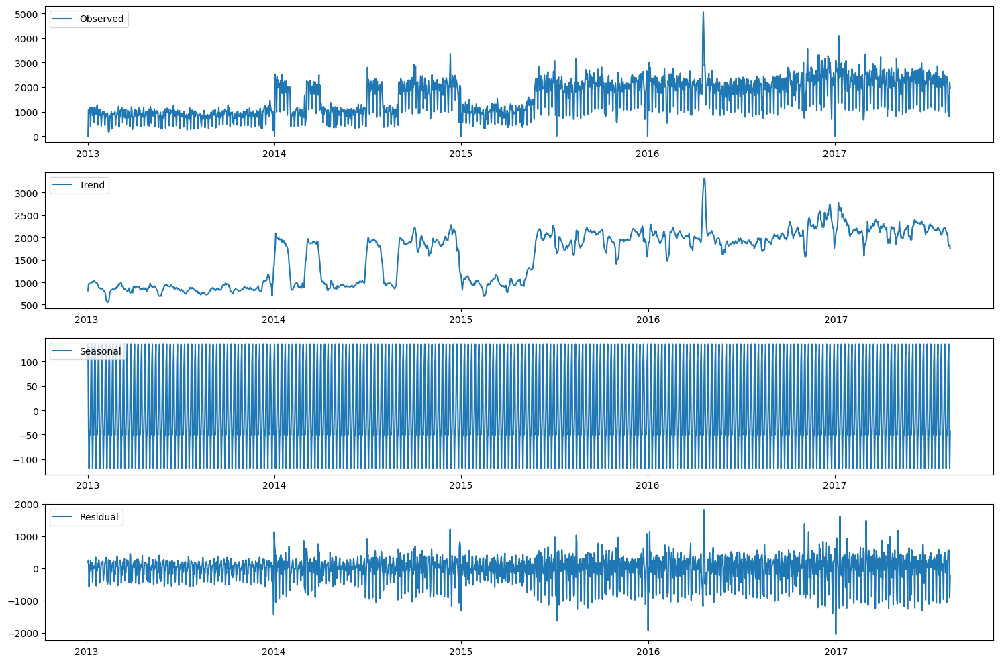

In [13]:
def plot_decomposition(decompositions, store, family):
    if (store, family) in decompositions:
        decomposition = decompositions[(store, family)]
        plt.figure(figsize=(15, 10))

        plt.subplot(411)
        plt.plot(decomposition["Observed"], label='Observed')
        plt.legend(loc='upper left')

        plt.subplot(412)
        plt.plot(decomposition["Trend"], label='Trend')
        plt.legend(loc='upper left')

        plt.subplot(413)
        plt.plot(decomposition["Seasonal"], label='Seasonal')
        plt.legend(loc='upper left')

        plt.subplot(414)
        plt.plot(decomposition["Residual"], label='Residual')
        plt.legend(loc='upper left')

        plt.tight_layout()
        plt.show()
    else:
        print(f"No data for store {store} and family {family}")

# Example usage:
plot_decomposition(decompositions, store=1, family='BEVERAGES')


### Exploring the Impact of National Holidays in SALES fluctuations

In [14]:
# Filter national holidays
national_holidays = holidays_events[holidays_events['locale'] == 'National']

# Aggregate sales data by date
sales_data = train.groupby(['date']).agg({'sales': 'sum'}).reset_index()

# Perform seasonal decomposition
freq = 7
sales_data.set_index('date', inplace=True)
decomposition = sm.tsa.seasonal_decompose(sales_data['sales'], model='additive', period=freq)

# Extract the residuals
residuals = decomposition.resid.dropna()

# Normalize the residuals
normalized_residuals = (residuals - residuals.mean()) / residuals.std()


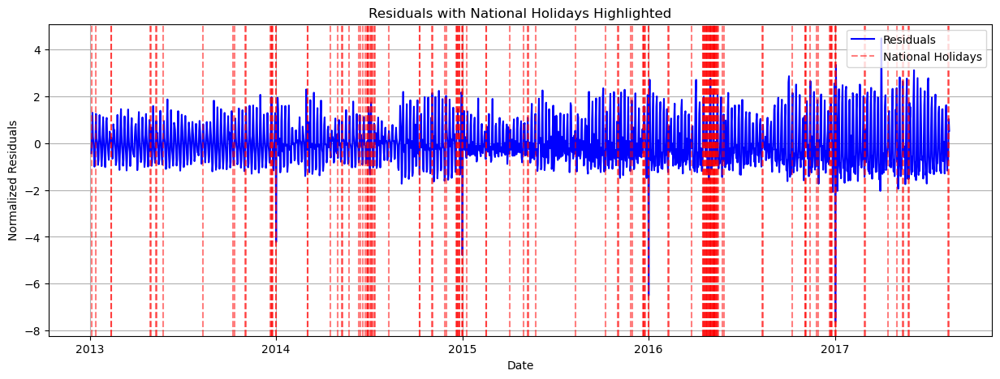

In [15]:
# Plot the residuals
plt.figure(figsize=(15, 5))
plt.plot(normalized_residuals, label='Residual', color='blue')

# Highlight national holidays
for holiday in national_holidays['date']:
    if holiday in normalized_residuals.index:
        plt.axvline(x=holiday, color='red', linestyle='--', alpha=0.5)

# Add labels and legend
plt.title('Residuals with National Holidays Highlighted')
plt.xlabel('Date')
plt.ylabel('Normalized Residuals')
plt.legend(['Residuals', 'National Holidays'], loc='upper right')
plt.grid(True)
plt.show()


## Moving averages, Autocorrelation, and Dickey-Fuller Tests

In [16]:
# Sort and aggregate sales data
train = train.sort_values(by=['store_nbr', 'family', 'date'])
sales_data = train.groupby(['store_nbr', 'family', 'date']).agg({'sales': 'sum'}).reset_index()

# Pivot the data to create time series for each store and family
sales_data_pivot = sales_data.pivot(index='date', columns=['store_nbr', 'family'], values='sales')

# Select specific store and family for analysis (example: store 1, family 'GROCERY I')
store = 1
family = 'GROCERY I'
time_series = sales_data_pivot[store][family].dropna()


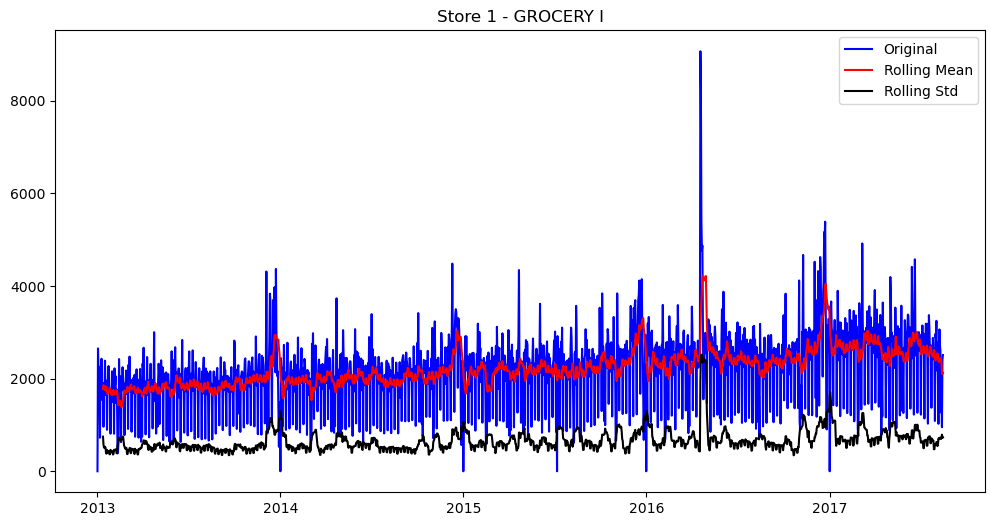

In [17]:
# Define the rolling window
window = 12

# Calculate rolling mean and standard deviation
rolling_mean = time_series.rolling(window=window).mean()
rolling_std = time_series.rolling(window=window).std()

# Plot the original time series, rolling mean, and rolling std
plt.figure(figsize=(12, 6))
plt.plot(time_series, color='blue', label='Original')
plt.plot(rolling_mean, color='red', label='Rolling Mean')
plt.plot(rolling_std, color='black', label='Rolling Std')
plt.title(f'Store {store} - {family}')
plt.legend(loc='best')
plt.show()


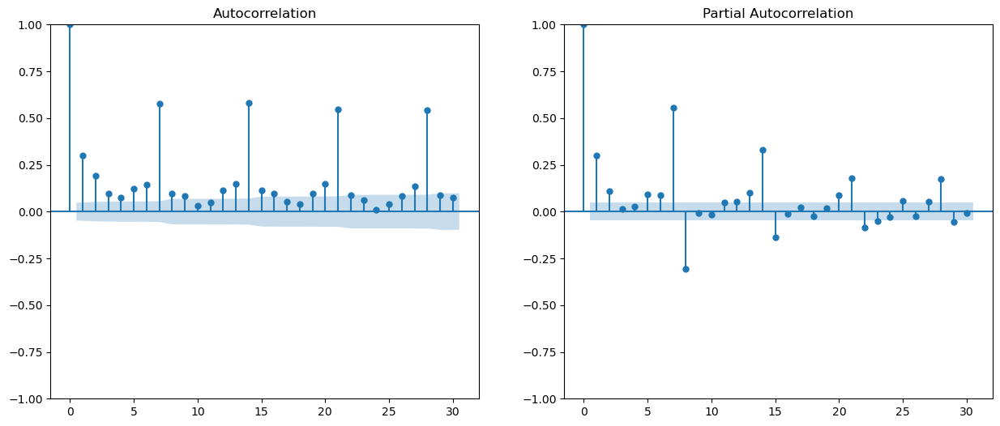

In [18]:
# Define the number of lags
lags = 30

# Plot ACF and PACF
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sm.graphics.tsa.plot_acf(time_series, lags=lags, ax=axes[0])
sm.graphics.tsa.plot_pacf(time_series, lags=lags, ax=axes[1])
plt.show()


In [19]:
# Perform Dickey-Fuller test
dftest = adfuller(time_series, autolag='AIC')

# Format the test results
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
for key, value in dftest[4].items():
    dfoutput[f'Critical Value ({key})'] = value

print(f'Results of Dickey-Fuller Test for Store {store} - {family}:')
print(dfoutput)



Results of Dickey-Fuller Test for Store 1 - GROCERY I:
Test Statistic                   -4.150401
p-value                           0.000799
#Lags Used                       24.000000
Number of Observations Used    1659.000000
Critical Value (1%)              -3.434298
Critical Value (5%)              -2.863284
Critical Value (10%)             -2.567698
dtype: float64


Given that the test statistic is more negative than the critical values and the p-value is very small, we reject the null hypothesis of the Dickey-Fuller test. This suggests that the time series data for Store 1 - GROCERY I is stationary, meaning it has a constant mean and variance over time, and does not have a unit root.  

## Key Modelling Decisions

## MODEL IMPLEMENTATION AND TRAINING - SARIMAX

In [20]:
# Filter data for a single store and product family
store_nbr = 1  # Example store number
family = 'GROCERY I'  # Example product family

# Filter training data
train_data = train[(train['store_nbr'] == store_nbr) & (train['family'] == family)]

# Create time series data
train_data.set_index('date', inplace=True)
train_data = train_data.resample('D').sum()  # Resample to daily frequency
train_data.fillna(0, inplace=True)  # Fill missing values if any

# Extract sales time series
sales_series = train_data['sales']


In [21]:
# Fit SARIMAX model
model = sm.tsa.statespace.SARIMAX(sales_series, 
                                  trend='ct',  # 'c' for constant, 't' for trend, 'ct' for both
                                  order=(4,1,0),  # ARIMA parameters (p, d, q)
                                  seasonal_order=(0,1,1,7))  # Seasonal parameters (P, D, Q, S)

results = model.fit()

# Display the model summary
print(results.summary())


                                      SARIMAX Results                                      
Dep. Variable:                               sales   No. Observations:                 1688
Model:             SARIMAX(4, 1, 0)x(0, 1, [1], 7)   Log Likelihood              -12976.903
Date:                             Wed, 03 Jul 2024   AIC                          25969.807
Time:                                     02:13:49   BIC                          26013.219
Sample:                                 01-01-2013   HQIC                         25985.888
                                      - 08-15-2017                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.4351      2.529      0.963      0.336      -2.522       7.392
drift         -0.0025      

In [22]:
# Forecast for the next 15 days
forecast_period = 15  # Number of days to forecast
forecast_index = pd.date_range(start=sales_series.index[-1] + timedelta(days=1), 
                               periods=forecast_period, 
                               freq='D')

# Get forecast
forecast = results.get_forecast(steps=forecast_period)
forecast_mean = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Combine forecasts with the original time series
forecast_series = pd.Series(forecast_mean, index=forecast_index)


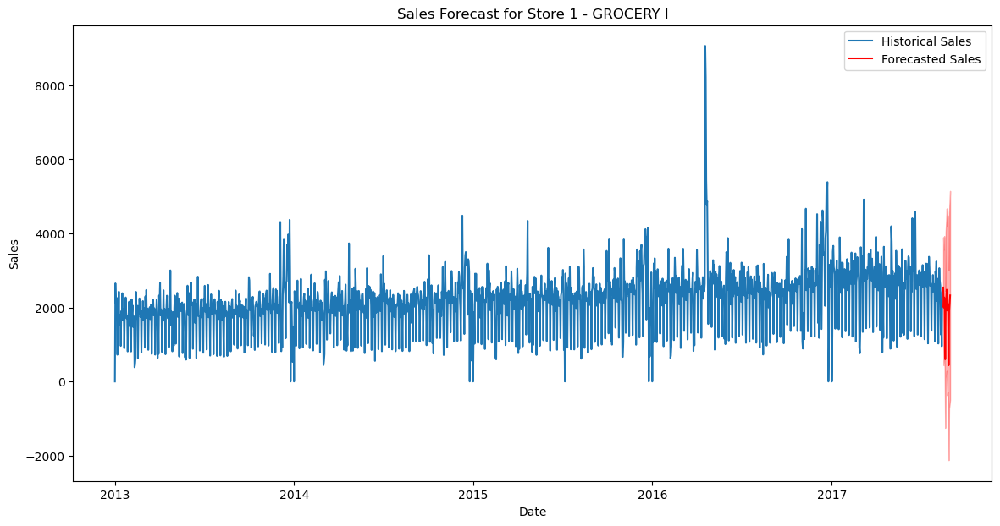

In [23]:
# Plot the results
plt.figure(figsize=(14, 7))
plt.plot(sales_series, label='Historical Sales')
plt.plot(forecast_series, label='Forecasted Sales', color='red')
plt.fill_between(forecast_conf_int.index, 
                 forecast_conf_int.iloc[:, 0], 
                 forecast_conf_int.iloc[:, 1], 
                 color='red', alpha=0.3)

plt.title(f'Sales Forecast for Store {store_nbr} - {family}')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()


## Cross Validation and Model Evaluation

### Calculating RMSE & MAE for Each Store Using the Train Data

In [24]:
# Define the number of days to hide for testing
test_period = 15

# Prepare to store results
results = []
metrics = []

# Loop through unique stores
for store_nbr in train['store_nbr'].unique():
    print(f"Processing Store: {store_nbr}")
    
    # Filter data for the current store
    store_data = train[train['store_nbr'] == store_nbr]
    store_data.set_index('date', inplace=True)
    store_data = store_data.resample('D').sum()  # Resample to daily frequency
    store_data.fillna(0, inplace=True)  # Fill missing values if any
    
    # Extract sales time series
    sales_series = store_data['sales']
    
    # Split data into training and test sets
    train_data = sales_series[:-test_period]
    test_data = sales_series[-test_period:]
    
    # Fit SARIMAX model
    model = SARIMAX(train_data, 
                    trend='ct', 
                    order=(4,1,0), 
                    seasonal_order=(0,1,1,7))
    results_model = model.fit()
    
    # Forecast the next 15 days
    forecast_index = pd.date_range(start=sales_series.index[-1] + timedelta(days=1), 
                                   periods=test_period, 
                                   freq='D')
    forecast = results_model.get_forecast(steps=test_period)
    forecast_mean = forecast.predicted_mean
    forecast_conf_int = forecast.conf_int()
    
    # Calculate metrics
    rmse = np.sqrt(mean_squared_error(test_data, forecast_mean))
    mae = mean_absolute_error(test_data, forecast_mean)
    
    # Store results
    results.append((store_nbr, forecast_mean, test_data, forecast_conf_int, rmse, mae))
    
    print(f"RMSE: {rmse:.2f}, MAE: {mae:.2f}")

# Prepare DataFrame for results
results_df = pd.DataFrame(results, columns=['Store', 'Forecast', 'Actual', 'Confidence Interval', 'RMSE', 'MAE'])



Processing Store: 1


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 2776.80, MAE: 2045.22
Processing Store: 2
RMSE: 1835.54, MAE: 1458.09
Processing Store: 3
RMSE: 4654.05, MAE: 3367.47
Processing Store: 4
RMSE: 2647.92, MAE: 2200.00
Processing Store: 5
RMSE: 1490.74, MAE: 1268.68
Processing Store: 6
RMSE: 2348.97, MAE: 1693.18
Processing Store: 7


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 3222.61, MAE: 2824.05
Processing Store: 8
RMSE: 2864.39, MAE: 2060.32
Processing Store: 9
RMSE: 4228.39, MAE: 3166.35
Processing Store: 10
RMSE: 1323.43, MAE: 1075.00
Processing Store: 11


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 4607.45, MAE: 3316.19
Processing Store: 12


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 2460.15, MAE: 2249.70
Processing Store: 13


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 2257.27, MAE: 2000.45
Processing Store: 14


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 2466.34, MAE: 2282.81
Processing Store: 15
RMSE: 930.30, MAE: 795.32
Processing Store: 16


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 1882.64, MAE: 1577.94
Processing Store: 17
RMSE: 2203.68, MAE: 1893.68
Processing Store: 18


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 1769.30, MAE: 1362.60
Processing Store: 19


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 2132.39, MAE: 1757.46
Processing Store: 20
RMSE: 4856.97, MAE: 3973.20
Processing Store: 21
RMSE: 3710.36, MAE: 3225.79
Processing Store: 22


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 1288.14, MAE: 1085.53
Processing Store: 23
RMSE: 825.03, MAE: 683.34
Processing Store: 24
RMSE: 2589.63, MAE: 2102.74
Processing Store: 25
RMSE: 3598.54, MAE: 2014.56
Processing Store: 26
RMSE: 1673.87, MAE: 1509.69
Processing Store: 27


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 2821.38, MAE: 2531.36
Processing Store: 28


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 3132.68, MAE: 2778.83
Processing Store: 29
RMSE: 2040.73, MAE: 1801.06
Processing Store: 30


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 1495.39, MAE: 1065.29
Processing Store: 31
RMSE: 2626.04, MAE: 2037.66
Processing Store: 32
RMSE: 1308.42, MAE: 1153.38
Processing Store: 33
RMSE: 1590.78, MAE: 1111.19
Processing Store: 34
RMSE: 1427.36, MAE: 1104.72
Processing Store: 35
RMSE: 888.22, MAE: 648.90
Processing Store: 36
RMSE: 1875.26, MAE: 1513.94
Processing Store: 37


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 4010.92, MAE: 3341.30
Processing Store: 38


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 5327.49, MAE: 4765.89
Processing Store: 39


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 3421.05, MAE: 2672.10
Processing Store: 40


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 3379.86, MAE: 2851.83
Processing Store: 41
RMSE: 2822.58, MAE: 2465.22
Processing Store: 42
RMSE: 3118.29, MAE: 2084.37
Processing Store: 43


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



RMSE: 2933.72, MAE: 2389.81
Processing Store: 44
RMSE: 8133.22, MAE: 6279.13
Processing Store: 45
RMSE: 6097.75, MAE: 4568.47
Processing Store: 46
RMSE: 6406.22, MAE: 4955.34
Processing Store: 47
RMSE: 6392.58, MAE: 4574.27
Processing Store: 48
RMSE: 6176.80, MAE: 4795.75
Processing Store: 49
RMSE: 4227.35, MAE: 3059.12
Processing Store: 50
RMSE: 5501.41, MAE: 4504.75
Processing Store: 51
RMSE: 2905.56, MAE: 2200.51
Processing Store: 52
RMSE: 3607.44, MAE: 2712.79
Processing Store: 53
RMSE: 1903.97, MAE: 1582.65
Processing Store: 54
RMSE: 1953.64, MAE: 1776.45


### Visualizing Historical, Actual, and Forecasted Sales for Each of the 54 Stores

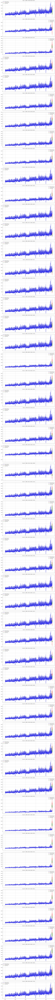

In [25]:
# Visualization
fig, axes = plt.subplots(len(results), 1, figsize=(15, len(results) * 5), sharex=True)
for i, (store_nbr, forecast_mean, test_data, forecast_conf_int, rmse, mae) in enumerate(results):
    ax = axes[i]
    ax.plot(store_data.index, sales_series, label='Historical Sales', color='blue')
    ax.plot(forecast_mean.index, forecast_mean, label='Forecasted Sales', color='red')
    ax.fill_between(forecast_conf_int.index, 
                    forecast_conf_int.iloc[:, 0], 
                    forecast_conf_int.iloc[:, 1], 
                    color='red', alpha=0.3)
    ax.plot(test_data.index, test_data, label='Actual Sales', color='green')
    ax.set_title(f'Store {store_nbr} - RMSE: {rmse:.2f}, MAE: {mae:.2f}')
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()


The visual support eralier conclusions on model acceptability. It is clear that the predictions are able to forecast the trends in sales for all the stores. Howver the model fails to capture the magintude accurately  for a number of the stores. Perhaps a better approach is to stick to predict for each family in a store.

### Calculating RMSE & MAE for each Product FAMILY in a single stor (Example store 1)

In [26]:
# Define the number of days to hide for testing
test_period = 15

# Prepare to store results
results = []

# Choose a specific store for cross-validation
store_nbr = 1  # Example store number, change as needed

print(f"Processing Store: {store_nbr}")

# Filter data for the current store
store_data = train[train['store_nbr'] == store_nbr]
store_data.set_index('date', inplace=True)

# Loop through unique product families
for family in store_data['family'].unique():
    print(f"Processing Product Family: {family}")
    
    # Filter data for the current product family
    family_data = store_data[store_data['family'] == family]
    
    # Resample to daily frequency while preserving family info
    family_data = family_data.resample('D').sum()  # Aggregates sales data by day
    family_data.fillna(0, inplace=True)  # Fill missing values if any
    
    # Extract sales time series
    sales_series = family_data['sales']
    
    # Split data into training and test sets
    train_data = sales_series[:-test_period]
    test_data = sales_series[-test_period:]
    
    # Fit SARIMAX model
    model = SARIMAX(train_data, 
                    trend='ct', 
                    order=(4,1,0), 
                    seasonal_order=(0,1,1,7))
    results_model = model.fit()
    
    # Forecast the next 15 days
    forecast_index = pd.date_range(start=sales_series.index[-1] + timedelta(days=1), 
                                   periods=test_period, 
                                   freq='D')
    forecast = results_model.get_forecast(steps=test_period)
    forecast_mean = forecast.predicted_mean
    forecast_conf_int = forecast.conf_int()
    
    # Calculate metrics
    rmse = np.sqrt(mean_squared_error(test_data, forecast_mean))
    mae = mean_absolute_error(test_data, forecast_mean)
    
    # Store results
    results.append((store_nbr, family, forecast_mean, test_data, forecast_conf_int, rmse, mae))
    
    print(f"Product Family {family} - RMSE: {rmse:.2f}, MAE: {mae:.2f}")

# Prepare DataFrame for results
results_df = pd.DataFrame(results, columns=['Store', 'Family', 'Forecast', 'Actual', 'Confidence Interval', 'RMSE', 'MAE'])




Processing Store: 1
Processing Product Family: AUTOMOTIVE


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family AUTOMOTIVE - RMSE: 2.99, MAE: 2.47
Processing Product Family: BABY CARE


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family BABY CARE - RMSE: 0.00, MAE: 0.00
Processing Product Family: BEAUTY


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family BEAUTY - RMSE: 2.89, MAE: 1.86
Processing Product Family: BEVERAGES


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family BEVERAGES - RMSE: 405.23, MAE: 262.16
Processing Product Family: BOOKS


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family BOOKS - RMSE: 0.46, MAE: 0.41
Processing Product Family: BREAD/BAKERY
Product Family BREAD/BAKERY - RMSE: 78.77, MAE: 51.61
Processing Product Family: CELEBRATION


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family CELEBRATION - RMSE: 7.32, MAE: 5.96
Processing Product Family: CLEANING


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family CLEANING - RMSE: 133.71, MAE: 103.20
Processing Product Family: DAIRY
Product Family DAIRY - RMSE: 132.52, MAE: 90.70
Processing Product Family: DELI
Product Family DELI - RMSE: 39.74, MAE: 29.25
Processing Product Family: EGGS
Product Family EGGS - RMSE: 33.18, MAE: 25.15
Processing Product Family: FROZEN FOODS
Product Family FROZEN FOODS - RMSE: 36.47, MAE: 25.59
Processing Product Family: GROCERY I
Product Family GROCERY I - RMSE: 527.48, MAE: 347.62
Processing Product Family: GROCERY II
Product Family GROCERY II - RMSE: 6.81, MAE: 5.37
Processing Product Family: HARDWARE
Product Family HARDWARE - RMSE: 1.62, MAE: 1.26
Processing Product Family: HOME AND KITCHEN I


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family HOME AND KITCHEN I - RMSE: 18.02, MAE: 14.29
Processing Product Family: HOME AND KITCHEN II
Product Family HOME AND KITCHEN II - RMSE: 7.18, MAE: 6.04
Processing Product Family: HOME APPLIANCES


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family HOME APPLIANCES - RMSE: 1.71, MAE: 1.59
Processing Product Family: HOME CARE


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family HOME CARE - RMSE: 53.96, MAE: 44.89
Processing Product Family: LADIESWEAR
Product Family LADIESWEAR - RMSE: 5.84, MAE: 4.54
Processing Product Family: LAWN AND GARDEN
Product Family LAWN AND GARDEN - RMSE: 6.03, MAE: 5.00
Processing Product Family: LINGERIE


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family LINGERIE - RMSE: 9.86, MAE: 7.68
Processing Product Family: LIQUOR,WINE,BEER


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family LIQUOR,WINE,BEER - RMSE: 32.46, MAE: 21.70
Processing Product Family: MAGAZINES
Product Family MAGAZINES - RMSE: 4.04, MAE: 3.00
Processing Product Family: MEATS


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family MEATS - RMSE: 95.44, MAE: 61.38
Processing Product Family: PERSONAL CARE
Product Family PERSONAL CARE - RMSE: 49.38, MAE: 32.97
Processing Product Family: PET SUPPLIES
Product Family PET SUPPLIES - RMSE: 1.78, MAE: 1.41
Processing Product Family: PLAYERS AND ELECTRONICS


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family PLAYERS AND ELECTRONICS - RMSE: 4.07, MAE: 2.99
Processing Product Family: POULTRY


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family POULTRY - RMSE: 78.68, MAE: 53.88
Processing Product Family: PREPARED FOODS
Product Family PREPARED FOODS - RMSE: 24.46, MAE: 19.56
Processing Product Family: PRODUCE
Product Family PRODUCE - RMSE: 419.23, MAE: 289.69
Processing Product Family: SCHOOL AND OFFICE SUPPLIES


C:\Users\Ian\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Product Family SCHOOL AND OFFICE SUPPLIES - RMSE: 0.03, MAE: 0.02
Processing Product Family: SEAFOOD
Product Family SEAFOOD - RMSE: 17.73, MAE: 11.81


### Visualizing Historical, Actual, and Forecasted Sales for Each Family in Store 1

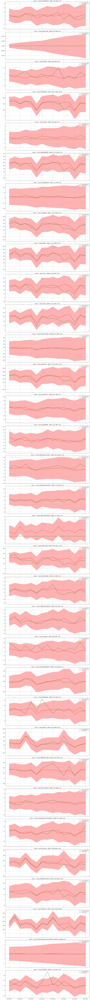

In [27]:
# Visualization
fig, axes = plt.subplots(len(results), 1, figsize=(15, len(results) * 5), sharex=True)
for i, (store_nbr, family, forecast_mean, test_data, forecast_conf_int, rmse, mae) in enumerate(results):
    ax = axes[i]
    ax.plot(forecast_mean.index, forecast_mean, label='Forecasted Sales', color='red')
    ax.plot(test_data.index, test_data, label='Actual Sales', color='green')
    ax.fill_between(forecast_conf_int.index, 
                    forecast_conf_int.iloc[:, 0], 
                    forecast_conf_int.iloc[:, 1], 
                    color='red', alpha=0.3)
    ax.set_title(f'Store {store_nbr} - Family {family} - RMSE: {rmse:.2f}, MAE: {mae:.2f}')
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

Like with the store sales the  store-family forecasts visuals indicate that the model is quite effecient in identifying trend but is not very accurate in determining the magintude..
pOSIIBLE SOLUTION INCLUDE:
    1. NORMALIZATION
    2. Incorporate additional features that could influence the magnitude of sales like oil prices (Ecuador is a oil dependent state), transactins data, holidays, and store type.
    3. Explore alternative models like prophet, XGBoost, and LSTM
    4. using metrics like Mean Absolute Percentage Error (MAPE) or Mean Squared Logarithmic Error (MSLE) to better understand magnitude prediction accuracy.
    